# 01.01 Exploratory Data Analysis: All Requests and by Neighborhood Council
## Issue 1279
---

# Table of Contents
---
### [Package & Data Imports  ](#Package-&-Data-Imports)
### [Exploratory Data Analysis - Contains analysis per capita, by type, by NC, etc.](#Explore)
> #### [All Requests in Dataset](#All-Requests)

> #### [Addresses w/ >= 2 Requests in Dataset](#>=2-Requests)

> #### [Addresses w/ >= 5 Requests in Dataset](#>=5-Requests)
### [Timeseries Exploratory Data Analysis](#Timeseries-EDA)

# Package & Data Imports
-----

In [1]:
import pandas as pd
from pandas import json_normalize
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
pd.set_option('display.max_columns', None)

import warnings
warnings.simplefilter("ignore")
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=DeprecationWarning)

In [2]:
# request clean dataset
df_311_raw = pd.read_csv('../data/clean_01Oct21_01Oct22_api.csv')
df_311 = df_311_raw.copy()

# Anupriya's Population Data
raw_pop = pd.read_csv('../data/pop_tracts_nc_final.csv')
pop = raw_pop.copy()

In [3]:
print(f'df_311 shape: {df_311.shape}')
df_311.head()

df_311 shape: (1042202, 16)


,requestId,createdDate,closedDate,typeId,typeName,address,latitude,longitude,agencyId,agencyName,sourceId,srnumber,sourceName,councilId,councilName,councilID
0,8610592,2021-10-01 00:01:14,2021-10-08 09:24:53,4,Bulky Items,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079512481,Phone Call,64,Pacoima,64
1,8610569,2021-10-01 00:02:19,2021-10-08 13:36:33,5,Electronic Waste,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079516251,Phone Call,64,Pacoima,64
2,8610575,2021-10-01 00:03:11,2021-10-13 12:31:58,4,Bulky Items,"4539 N VISTA DEL MONTE AVE, 91403",34.154158,-118.450025,3,Sanitation Bureau,8,1-2079512561,Phone Call,72,Sherman Oaks,72
3,8612855,2021-10-01 00:04:14,2021-10-05 14:25:02,6,Illegal Dumping,"918 W COLLEGE ST, 90012",34.066466,-118.245113,3,Sanitation Bureau,3,1-2079516331,Email,38,Historic Cultural North,38
4,8610587,2021-10-01 00:05:25,2021-10-08 14:16:32,7,Metal/Appliances,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079516401,Phone Call,64,Pacoima,64


In [4]:
pop.head()

,Unnamed: 0,NAME,NC_ID,total_population,area,pop_density
0,0,ARLETA NC,6,35585,3.284868,10833.007723
1,1,ARROYO SECO NC,42,19479,3.063327,6358.773341
2,2,ARTS DISTRICT LITTLE TOKYO NC,46,4153,0.879216,4723.528997
3,3,ATWATER VILLAGE NC,37,14665,8.748450,1676.296980
4,4,BEL AIR-BEVERLY CREST NC,64,24732,17.038756,1451.514436


In [5]:
# merge pop and 311
df_311 = pd.merge(df_311, pop, how = 'left', left_on = 'councilId', right_on = 'NC_ID')
df_311.drop(columns = ['Unnamed: 0', 'NAME', 'NC_ID'], inplace = True)
# add to drop 'total_population', 'area_y', 'pop_density_y'
#df_311.rename(columns = {'total_population_x':'total_population', 'area_x':'area', 'pop_density_x':'pop_density'}, inplace = True)
df_311.head()

,requestId,createdDate,closedDate,typeId,typeName,address,latitude,longitude,agencyId,agencyName,sourceId,srnumber,sourceName,councilId,councilName,councilID,total_population,area,pop_density
0,8610592,2021-10-01 00:01:14,2021-10-08 09:24:53,4,Bulky Items,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079512481,Phone Call,64,Pacoima,64,24732.0,17.038756,1451.514436
1,8610569,2021-10-01 00:02:19,2021-10-08 13:36:33,5,Electronic Waste,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079516251,Phone Call,64,Pacoima,64,24732.0,17.038756,1451.514436
2,8610575,2021-10-01 00:03:11,2021-10-13 12:31:58,4,Bulky Items,"4539 N VISTA DEL MONTE AVE, 91403",34.154158,-118.450025,3,Sanitation Bureau,8,1-2079512561,Phone Call,72,Sherman Oaks,72,NaN,NaN,NaN
3,8612855,2021-10-01 00:04:14,2021-10-05 14:25:02,6,Illegal Dumping,"918 W COLLEGE ST, 90012",34.066466,-118.245113,3,Sanitation Bureau,3,1-2079516331,Email,38,Historic Cultural North,38,30626.0,2.840725,10781.050656
4,8610587,2021-10-01 00:05:25,2021-10-08 14:16:32,7,Metal/Appliances,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079516401,Phone Call,64,Pacoima,64,24732.0,17.038756,1451.514436


In [6]:
df_311.to_csv('../data/clean_pop_01Oct21_01Oct22_api.csv', index = False)

# All Requests
---

Dates are only for 10/01/2021-10/01/2022

In [7]:
df_311.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
requestId,1042202.0,NaN,NaN,NaN,9662942.848746,601992.274658,8610569.0,9144645.25,9659138.5,10180138.75,10747580.0
createdDate,1042202,921751,2022-08-08 11:02:03,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN
closedDate,1042202,1010282,2021-11-15 00:00:00,72,NaN,NaN,NaN,NaN,NaN,NaN,NaN
typeId,1042202.0,NaN,NaN,NaN,3.802691,2.139082,1.0,2.0,4.0,4.0,12.0
typeName,1042202,12,Bulky Items,490106,NaN,NaN,NaN,NaN,NaN,NaN,NaN
address,1042202,364214,"1901 E 6TH ST, 90033",575,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,1042202.0,NaN,NaN,NaN,34.09044,0.122377,33.705737,34.020332,34.079041,34.192951,34.334335
longitude,1042202.0,NaN,NaN,NaN,-118.363991,0.110621,-118.667817,-118.443194,-118.335812,-118.277894,-118.155779
agencyId,1042202.0,NaN,NaN,NaN,3.24552,0.575133,1.0,3.0,3.0,4.0,12.0
agencyName,1042202,8,Sanitation Bureau,756066,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
# count of requests by type and neighborhood council per capita
type_nc_ct = df_311.groupby(['typeName', 'councilName', 'total_population'])['requestId'].agg('count').reset_index(name = 'request_count')
type_nc_ct.sort_values(by = 'request_count', ascending = False).reset_index(drop = True, inplace = True)
type_nc_ct['per_capita'] = type_nc_ct['request_count']/type_nc_ct['total_population']

In [9]:
# plot top 20 NC 311 requests by type per capita
type_nc_ct.sort_values(by = 'per_capita', ascending = False, inplace = True)
type_nc_ct.head(20)

,typeName,councilName,total_population,request_count,per_capita
117,Bulky Items,Los Feliz,4153.0,4706,1.133157
115,Bulky Items,LA-32,6926.0,6367,0.919290
102,Bulky Items,Granada Hills South,12027.0,5336,0.443668
330,Graffiti,Los Feliz,4153.0,1535,0.369612
130,Bulky Items,Pacoima,24732.0,8392,0.339317
111,Bulky Items,Historic Highland Park,22120.0,7386,0.333906
96,Bulky Items,Empowerment Congress Southwest,17395.0,5719,0.328773
105,Bulky Items,Greater Wilshire,18204.0,5906,0.324434
155,Bulky Items,Wilshire Center - Koreatown,28209.0,8578,0.304087
350,Graffiti,South Central,52607.0,14874,0.282738


In [10]:
# count of requests by neighborhood council per capita
nc_ct = df_311.groupby(['councilName', 'total_population'])['requestId'].agg('count').reset_index(name = 'request_count')
nc_ct['per_capita'] = nc_ct['request_count']/nc_ct['total_population']
nc_ct.sort_values(by = 'per_capita', ascending = False, inplace = True)
nc_ct.reset_index(drop = True, inplace = True)

In [11]:
nc_ct.head()

,councilName,total_population,request_count,per_capita
0,Los Feliz,4153.0,8596,2.069829
1,LA-32,6926.0,10709,1.546203
2,Granada Hills South,12027.0,9639,0.801447
3,Wilshire Center - Koreatown,28209.0,19458,0.689780
4,Pacoima,24732.0,16475,0.666141


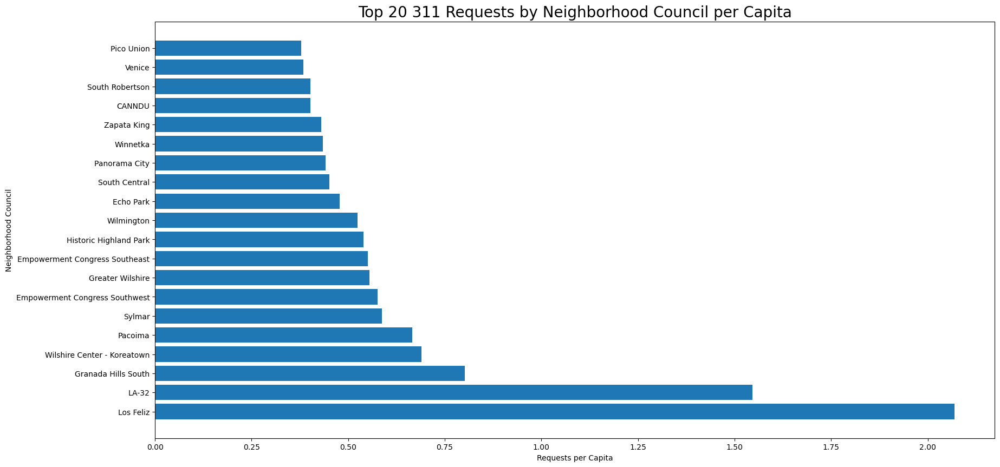

<Figure size 640x480 with 0 Axes>

In [12]:
NC = list(nc_ct['councilName'].head(20))
per_cap = (list(nc_ct['per_capita'].head(20)))

plt.figure(figsize = (20, 10))
plt.barh(NC, per_cap)

plt.ylabel("Neighborhood Council")
plt.xlabel("Requests per Capita") 
plt.title("Top 20 311 Requests by Neighborhood Council per Capita", fontsize = '20')
plt.show()

plt.savefig('../images/all_req_nc_capita.jpg')

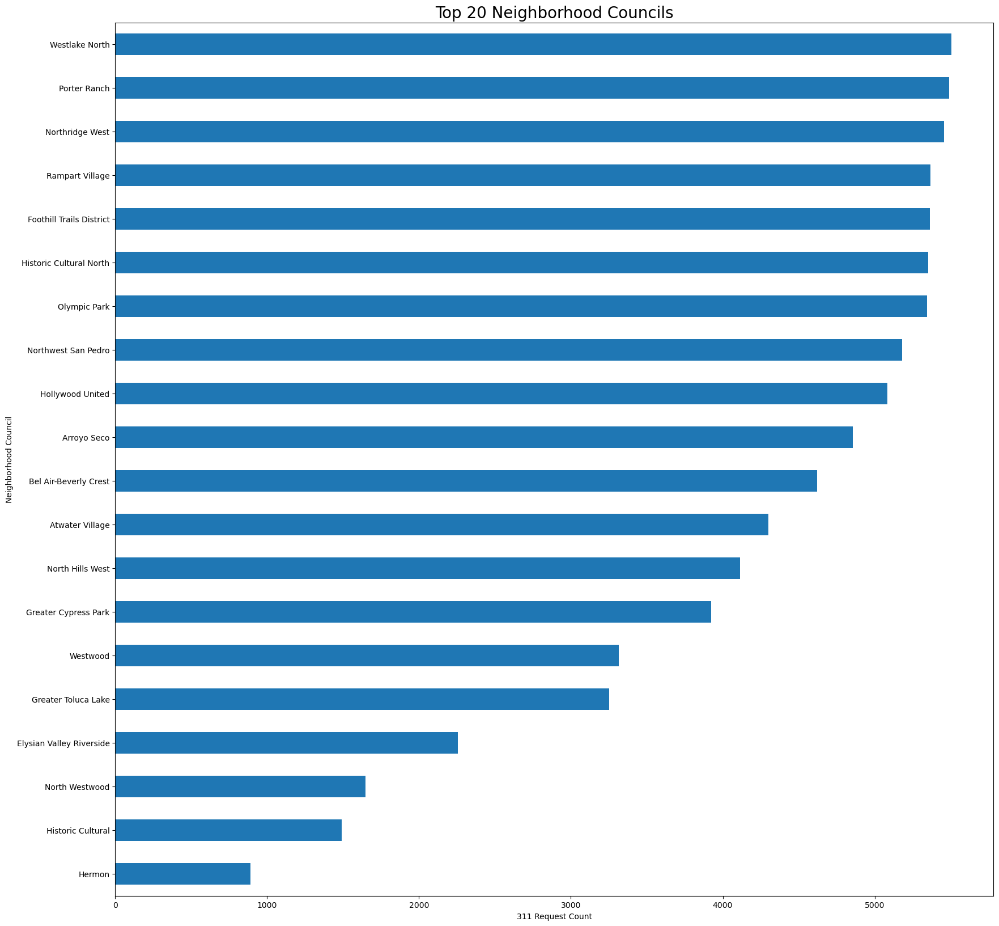

In [13]:
# Bar chart for type of request counts for all requests
plt.figure(figsize = (20,20))
df_311['councilName'].value_counts().sort_values(ascending = True).head(20).plot(kind = 'barh')
plt.title('Top 20 Neighborhood Councils', fontsize = '20')
plt.ylabel('Neighborhood Council')
plt.xlabel('311 Request Count')

plt.savefig('../images/all_req_nc.jpg', pad_inches = .5)

plt.show();

In [14]:
for nc in sorted(df_311['councilName'].unique()):
    print(f'{nc}: {(len(df_311[df_311["councilName"] == nc]) / len(df_311))*100}% of whole dataset')
    print()

Arleta: 1.012855473315154% of whole dataset

Arroyo Seco: 0.4660324965793579% of whole dataset

Atwater Village: 0.4125879627941608% of whole dataset

Bel Air-Beverly Crest: 0.4434840846592119% of whole dataset

Boyle Heights: 2.957488087721958% of whole dataset

CANNDU: 1.3750693243728183% of whole dataset

Canoga Park: 1.0445192006923802% of whole dataset

Central Alameda: 0.7989813874853434% of whole dataset

Central Hollywood: 0.5302235075350076% of whole dataset

Central San Pedro: 1.0116081143578692% of whole dataset

Chatsworth: 1.075799125313519% of whole dataset

Coastal San Pedro: 0.7686609697544238% of whole dataset

Del Rey: 0.6927639747381026% of whole dataset

Downtown Los Angeles: 1.7470701457107163% of whole dataset

Eagle Rock: 0.7463044592123216% of whole dataset

East Hollywood: 1.8132761211358257% of whole dataset

Echo Park: 1.6145622441714753% of whole dataset

Elysian Valley Riverside: 0.21646475443340157% of whole dataset

Empowerment Congress Central: 1.4118184

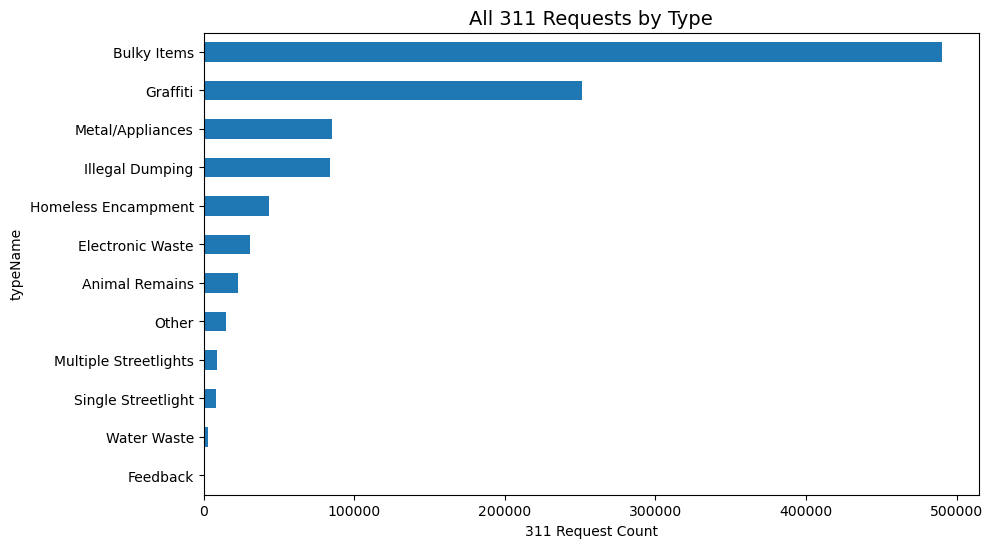

In [15]:
# Bar chart for type of request counts for all requests
plt.figure(figsize = (10,6))
df_311['typeName'].value_counts().sort_values(ascending = True).plot(kind = 'barh')
plt.title('All 311 Requests by Type', fontsize = '14')
plt.ylabel('typeName')
plt.xlabel('311 Request Count')

plt.savefig('../images/all_req_type.jpg', pad_inches='0.5')

plt.show();

In [16]:
for value in sorted(df_311['typeName'].unique()):
    print(f'{value}: {(len(df_311[df_311["typeName"] == value]) / len(df_311))*100}% of whole dataset')
    print()

Animal Remains: 2.1659908539803223% of whole dataset

Bulky Items: 47.026008393766276% of whole dataset

Electronic Waste: 2.9459740050393304% of whole dataset

Feedback: 0.0269621436151533% of whole dataset

Graffiti: 24.091298999618115% of whole dataset

Homeless Encampment: 4.16541131181863% of whole dataset

Illegal Dumping: 8.02944150941948% of whole dataset

Metal/Appliances: 8.164827931629377% of whole dataset

Multiple Streetlights: 0.8527137733376063% of whole dataset

Other: 1.4536529386817527% of whole dataset

Single Streetlight: 0.7903458254733727% of whole dataset

Water Waste: 0.28737231362058413% of whole dataset



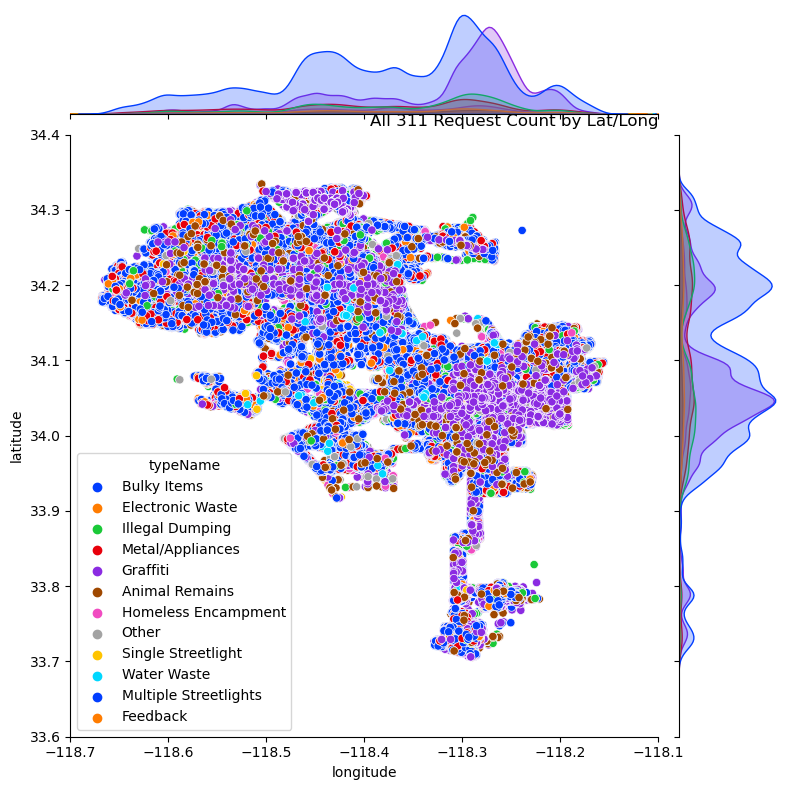

In [17]:
# type by location
sns.jointplot(x = df_311['longitude'], y = df_311['latitude'], hue = df_311['typeName'], 
              kind='scatter', color = 'green', height = 8, palette = 'bright', 
              xlim = (-118.7, -118.1), ylim = (33.6, 34.4)
             )
plt.title('All 311 Request Count by Lat/Long', loc = 'right')

plt.savefig('../images/all_req_jointplt.jpg')

plt.show();

# >=2 Requests
---

In [18]:
by_address = df_311.groupby(['typeName', 'latitude', 'longitude', 'councilId', 
                             'councilName'])['address'].value_counts().sort_values(ascending = False).reset_index(name='count')
grt_eq_2_ct = by_address[by_address['count'] >= 2]
print(grt_eq_2_ct.size)
grt_eq_2_ct.head()

1286215


,typeName,latitude,longitude,councilId,councilName,address,count
0,Graffiti,34.040224,-118.219759,5,Boyle Heights,"1901 E 6TH ST, 90033",575
1,Graffiti,34.297026,-118.419005,79,Sylmar,"BRAND BLVD AT FOOTHILL BLVD, 91340",421
2,Homeless Encampment,34.225457,-118.366056,77,Sun Valley Area,"8601 N SUNLAND BLVD, 91352",261
3,Graffiti,34.040055,-118.219868,5,Boyle Heights,"1900 E 6TH ST, 90033",234
4,Graffiti,34.296286,-118.455561,79,Sylmar,ASTORIA ST AT SAN FERNANDO ROAD SOUTHWEST RDWY...,205


In [19]:
grt_eq_2_ct.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
typeName,183745,12,Bulky Items,102576,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,183745.0,NaN,NaN,NaN,34.08987,0.123331,33.706052,34.01878,34.079963,34.193178,34.334335
longitude,183745.0,NaN,NaN,NaN,-118.365509,0.110721,-118.667806,-118.443639,-118.340945,-118.280065,-118.155779
councilId,183745.0,NaN,NaN,NaN,51.03137,30.075334,0.0,22.0,52.0,78.0,99.0
councilName,183745,100,Boyle Heights,5080,NaN,NaN,NaN,NaN,NaN,NaN,NaN
address,183745,149695,"4705 N WHITSETT AVE, 91604",10,NaN,NaN,NaN,NaN,NaN,NaN,NaN
count,183745.0,NaN,NaN,NaN,3.708438,4.557356,2.0,2.0,2.0,4.0,575.0


In [20]:
# https://stackoverflow.com/questions/32918506/pandas-how-to-filter-dataframe-for-duplicate-items-that-occur-at-least-n-times
grt_eq_2_df = df_311[df_311['address'].isin(df_311['address'].value_counts()[df_311['address'].value_counts()>=2].index)]
print(grt_eq_2_df.shape)
grt_eq_2_df.head()

(871890, 19)


,requestId,createdDate,closedDate,typeId,typeName,address,latitude,longitude,agencyId,agencyName,sourceId,srnumber,sourceName,councilId,councilName,councilID,total_population,area,pop_density
0,8610592,2021-10-01 00:01:14,2021-10-08 09:24:53,4,Bulky Items,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079512481,Phone Call,64,Pacoima,64,24732.0,17.038756,1451.514436
1,8610569,2021-10-01 00:02:19,2021-10-08 13:36:33,5,Electronic Waste,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079516251,Phone Call,64,Pacoima,64,24732.0,17.038756,1451.514436
3,8612855,2021-10-01 00:04:14,2021-10-05 14:25:02,6,Illegal Dumping,"918 W COLLEGE ST, 90012",34.066466,-118.245113,3,Sanitation Bureau,3,1-2079516331,Email,38,Historic Cultural North,38,30626.0,2.840725,10781.050656
4,8610587,2021-10-01 00:05:25,2021-10-08 14:16:32,7,Metal/Appliances,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079516401,Phone Call,64,Pacoima,64,24732.0,17.038756,1451.514436
5,8610607,2021-10-01 00:10:13,2021-10-20 03:57:42,6,Illegal Dumping,"PICO BLVD AT MILITARY AVE, 90064",34.038036,-118.432884,3,Sanitation Bureau,8,1-2079516601,Phone Call,93,Westside,93,54503.0,16.559332,3291.376658


In [21]:
# count of requests (for address with more than 2 requests) by neighborhood council per capita
grt_2_nc_ct = grt_eq_2_df.groupby(['councilName', 'total_population'])['requestId'].agg('count').reset_index(name = 'request_count')
grt_2_nc_ct['per_capita'] = grt_2_nc_ct['request_count']/grt_2_nc_ct['total_population']
grt_2_nc_ct.sort_values(by = 'per_capita', ascending = False, inplace = True)
grt_2_nc_ct.reset_index(drop = True, inplace = True)

In [22]:
grt_2_nc_ct.head()

,councilName,total_population,request_count,per_capita
0,Los Feliz,4153.0,6954,1.674452
1,LA-32,6926.0,8466,1.222351
2,Granada Hills South,12027.0,7921,0.658601
3,Wilshire Center - Koreatown,28209.0,17656,0.625900
4,Pacoima,24732.0,13980,0.565260


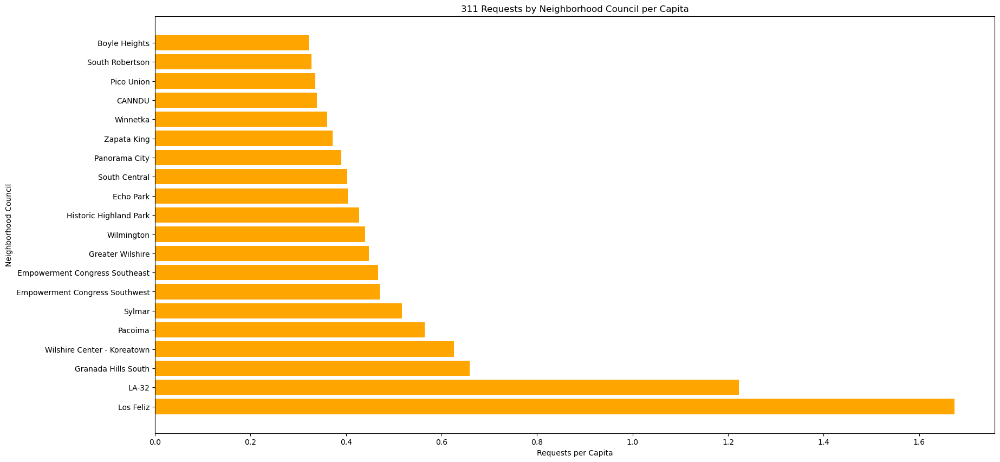

In [23]:
NC = list(grt_2_nc_ct['councilName'].head(20))
per_cap = list(grt_2_nc_ct['per_capita'].head(20))

plt.figure(figsize = (20, 10))
plt.barh(NC, per_cap, color = 'orange')

plt.ylabel("Neighborhood Council")
plt.xlabel("Requests per Capita")
plt.title("311 Requests by Neighborhood Council per Capita")
plt.show()

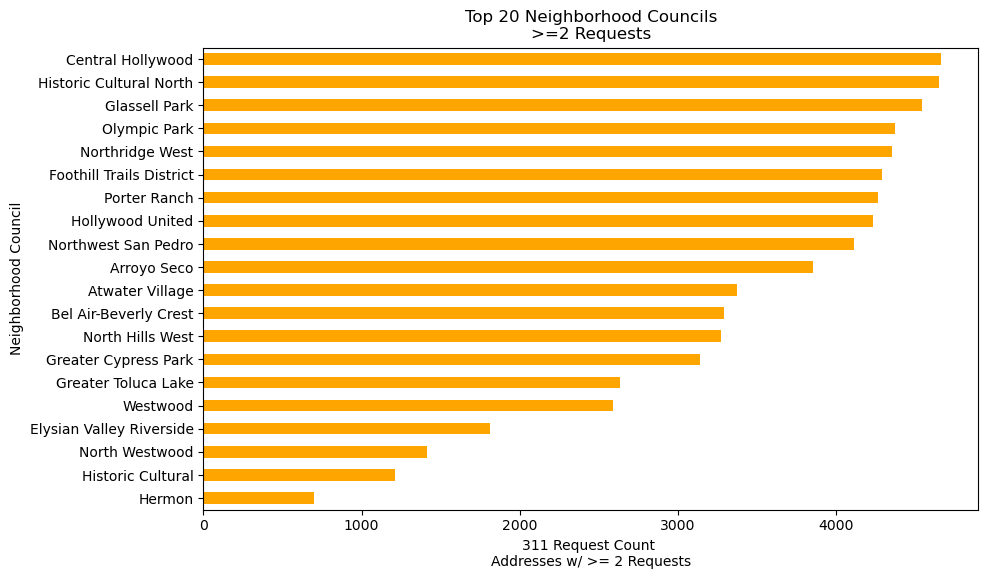

In [24]:
# Bar chart councilName for Neighborhood Councils with >=2 requests; top 20
plt.figure(figsize = (10,6))
grt_eq_2_df['councilName'].value_counts().sort_values(ascending = True).head(20).plot(kind = 'barh', color = 'orange')
plt.title('Top 20 Neighborhood Councils\n>=2 Requests')
plt.ylabel('Neighborhood Council')
plt.xlabel('311 Request Count \nAddresses w/ >= 2 Requests')

plt.savefig('../images/grt_eq_2_nc.jpg')

plt.show();

In [25]:
# count of requests by type and neighborhood council for addresses with >= 2 requests
grt_eq_2_type_nc_ct = grt_eq_2_df.groupby(['typeName', 'councilName'])['requestId'].agg('count').reset_index(name = 'request_count')
grt_eq_2_type_nc_ct.sort_values(by = 'request_count', ascending = False).head(20)

,typeName,councilName,request_count
369,Graffiti,Boyle Heights,14563
439,Graffiti,South Central,13836
183,Bulky Items,Van Nuys,10535
378,Graffiti,Downtown Los Angeles,10300
120,Bulky Items,Empowerment Congress Southeast,8832
179,Bulky Items,Sylmar,8605
380,Graffiti,East Hollywood,8134
171,Bulky Items,Reseda,8041
444,Graffiti,Sylmar,7944
196,Bulky Items,Wilshire Center - Koreatown,7887


In [26]:
grt_eq_2_type_nc_ct.sort_values(by = 'request_count', ascending = False).tail(20)

,typeName,councilName,request_count
342,Feedback,Palms,1
338,Feedback,North Westwood,1
1082,Water Waste,Empowerment Congress Central,1
335,Feedback,No council,1
354,Feedback,Tarzana,1
356,Feedback,Valley Village,1
1099,Water Waste,Hermon,1
329,Feedback,Lake Balboa,1
328,Feedback,LA-32,1
325,Feedback,Historic Cultural North,1


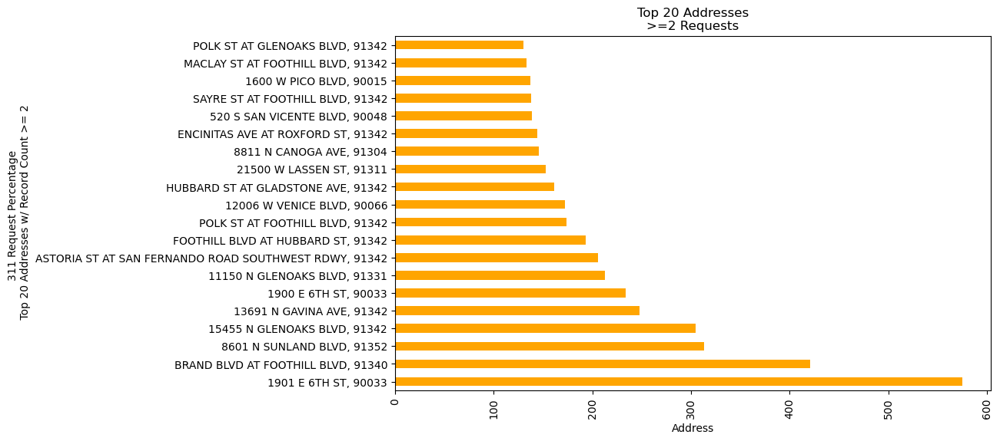

In [28]:
# Addresses with >=2 requests
plt.figure(figsize = (10, 6))
grt_eq_2_df['address'].value_counts().sort_values(ascending = False).head(20).plot(kind = 'barh', color = 'orange')
plt.title('Top 20 Addresses\n>=2 Requests')
plt.xlabel('Address')
plt.ylabel('311 Request Percentage \n Top 20 Addresses w/ Record Count >= 2')
plt.xticks(rotation=90)

plt.savefig('../images/grt_eq_2_addresses.jpg')

plt.show();

In [29]:
# count of requests by type and address for addresses with >= 2 requests
grt_eq_2_type_add_ct = grt_eq_2_df.groupby(['typeName', 'address'])['requestId'].agg('count').reset_index(name = 'request_count')
grt_eq_2_type_add_ct.sort_values(by = 'request_count', ascending = False).head(20)

,typeName,address,request_count
198121,Graffiti,"1901 E 6TH ST, 90033",575
230490,Graffiti,"BRAND BLVD AT FOOTHILL BLVD, 91340",421
245909,Homeless Encampment,"8601 N SUNLAND BLVD, 91352",263
198033,Graffiti,"1900 E 6TH ST, 90033",234
230225,Graffiti,ASTORIA ST AT SAN FERNANDO ROAD SOUTHWEST RDWY...,205
231241,Graffiti,"FOOTHILL BLVD AT HUBBARD ST, 91342",188
51485,Bulky Items,"15455 N GLENOAKS BLVD, 91342",184
232803,Graffiti,"POLK ST AT FOOTHILL BLVD, 91342",171
231676,Graffiti,"HUBBARD ST AT GLADSTONE AVE, 91342",161
20644,Bulky Items,"11150 N GLENOAKS BLVD, 91331",160


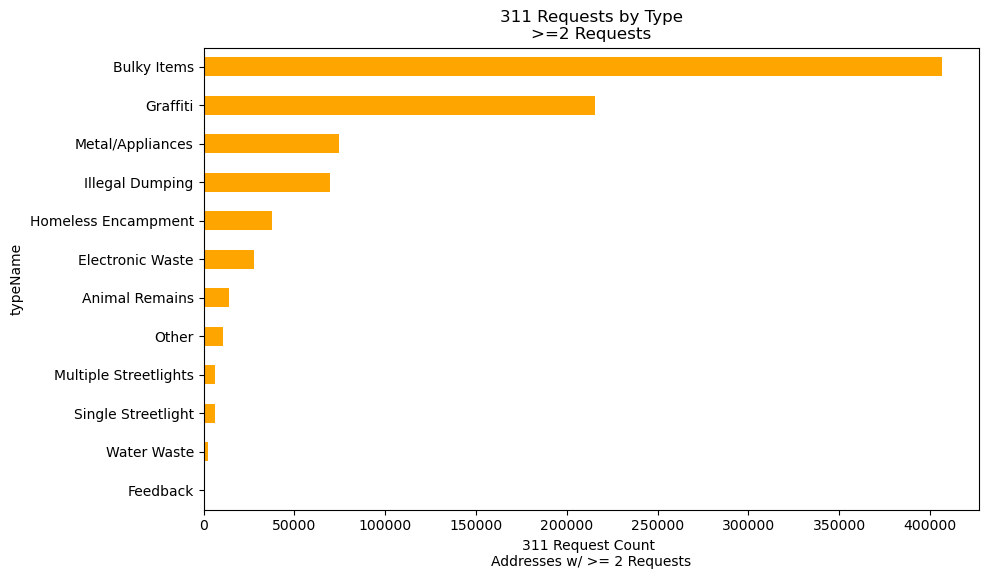

In [30]:
# Bar chart types of requests for address with >=2 requests
plt.figure(figsize = (10,6))
grt_eq_2_df['typeName'].value_counts().sort_values(ascending = True).plot(kind = 'barh', color = 'orange')
plt.title('311 Requests by Type\n>=2 Requests')
plt.ylabel('typeName')
plt.xlabel('311 Request Count \nAddresses w/ >= 2 Requests')

plt.savefig('../images/grt_eq_2_type.jpg')

plt.show();

In [31]:
for value in sorted(grt_eq_2_df['typeName'].unique()):
    print(f'{value}: {(len(grt_eq_2_df[grt_eq_2_df["typeName"] == value]) / len(grt_eq_2_df))*100}% of >=2 dataset')
    print()

Animal Remains: 1.6183234123570633% of >=2 dataset

Bulky Items: 46.617004438633316% of >=2 dataset

Electronic Waste: 3.1625549094495864% of >=2 dataset

Feedback: 0.02649416784227368% of >=2 dataset

Graffiti: 24.74245604376699% of >=2 dataset

Homeless Encampment: 4.314879170537568% of >=2 dataset

Illegal Dumping: 8.013854958767734% of >=2 dataset

Metal/Appliances: 8.581931206918304% of >=2 dataset

Multiple Streetlights: 0.7246326944912775% of >=2 dataset

Other: 1.2432761013430593% of >=2 dataset

Single Streetlight: 0.6942389521613965% of >=2 dataset

Water Waste: 0.26035394373143406% of >=2 dataset



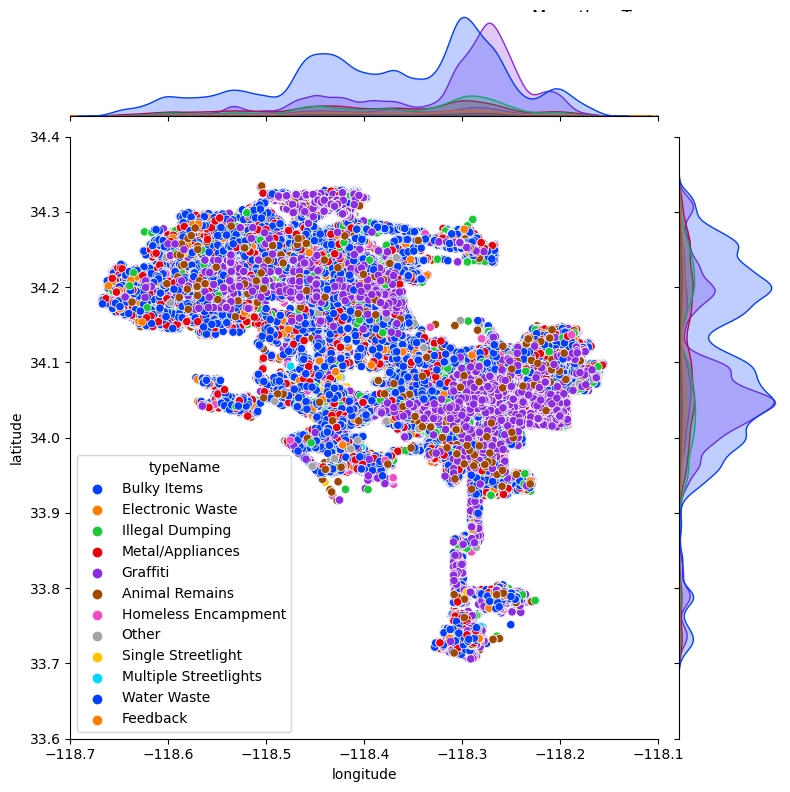

In [32]:
# Address with >=2 requests
sns.jointplot(x = grt_eq_2_df['longitude'], y = grt_eq_2_df['latitude'], hue = grt_eq_2_df['typeName'],
              kind='scatter', height = 8, palette = 'bright', 
              xlim = (-118.7, -118.1), ylim = (33.6, 34.4)
             )
plt.title('More than Two \n 311 Request Count by Lat/Long', pad = 70, loc = 'right')

plt.savefig('../images/grt_eq_2_jointplt.jpg')

plt.show();

# >=5 Requests
---

In [33]:
by_address = df_311.groupby(['typeName', 'latitude', 'longitude', 'councilId', 'councilName'])['address'].value_counts().sort_values(ascending = False).reset_index(name='count')
grt_eq_5_ct = by_address[by_address['count'] >= 5]

In [34]:
grt_eq_5_ct.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
typeName,34058,12,Bulky Items,17896,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,34058.0,NaN,NaN,NaN,34.089615,0.119518,33.706052,34.025398,34.076688,34.190088,34.334335
longitude,34058.0,NaN,NaN,NaN,-118.359563,0.108301,-118.667806,-118.439985,-118.323623,-118.276522,-118.155969
councilId,34058.0,NaN,NaN,NaN,51.453139,30.071169,0.0,22.0,52.0,78.0,99.0
councilName,34058,100,Boyle Heights,1099,NaN,NaN,NaN,NaN,NaN,NaN,NaN
address,34058,31088,"12001 W FOOTHILL BLVD, 91342",7,NaN,NaN,NaN,NaN,NaN,NaN,NaN
count,34058.0,NaN,NaN,NaN,9.057108,8.646663,5.0,5.0,7.0,10.0,575.0


In [35]:
# https://stackoverflow.com/questions/32918506/pandas-how-to-filter-dataframe-for-duplicate-items-that-occur-at-least-n-times
grt_eq_5_df = df_311[df_311['address'].isin(df_311['address'].value_counts()[df_311['address'].value_counts()>=5].index)]
print(grt_eq_5_df.shape)
grt_eq_5_df.head()

(503459, 19)


,requestId,createdDate,closedDate,typeId,typeName,address,latitude,longitude,agencyId,agencyName,sourceId,srnumber,sourceName,councilId,councilName,councilID,total_population,area,pop_density
0,8610592,2021-10-01 00:01:14,2021-10-08 09:24:53,4,Bulky Items,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079512481,Phone Call,64,Pacoima,64,24732.0,17.038756,1451.514436
1,8610569,2021-10-01 00:02:19,2021-10-08 13:36:33,5,Electronic Waste,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079516251,Phone Call,64,Pacoima,64,24732.0,17.038756,1451.514436
3,8612855,2021-10-01 00:04:14,2021-10-05 14:25:02,6,Illegal Dumping,"918 W COLLEGE ST, 90012",34.066466,-118.245113,3,Sanitation Bureau,3,1-2079516331,Email,38,Historic Cultural North,38,30626.0,2.840725,10781.050656
4,8610587,2021-10-01 00:05:25,2021-10-08 14:16:32,7,Metal/Appliances,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079516401,Phone Call,64,Pacoima,64,24732.0,17.038756,1451.514436
5,8610607,2021-10-01 00:10:13,2021-10-20 03:57:42,6,Illegal Dumping,"PICO BLVD AT MILITARY AVE, 90064",34.038036,-118.432884,3,Sanitation Bureau,8,1-2079516601,Phone Call,93,Westside,93,54503.0,16.559332,3291.376658


In [36]:
# grt_eq_5_df.groupby(['councilName', 'typeName'])['requestId'].agg('count').reset_index(name = 'request_count').sort_values(by = 'request_count', ascending = False).head(20)

In [37]:
# count of requests (for address with more than 5 requests) by neighborhood council per capita
grt_5_nc_ct = grt_eq_5_df.groupby(['councilName', 'total_population'])['requestId'].agg('count').reset_index(name = 'request_count')
grt_5_nc_ct['per_capita'] = grt_5_nc_ct['request_count']/grt_5_nc_ct['total_population']
grt_5_nc_ct.sort_values(by = 'per_capita', ascending = False, inplace = True)
grt_5_nc_ct.reset_index(drop = True, inplace = True)

In [38]:
grt_5_nc_ct.head()

,councilName,total_population,request_count,per_capita
0,Los Feliz,4153.0,3683,0.886829
1,LA-32,6926.0,3923,0.566416
2,Wilshire Center - Koreatown,28209.0,13066,0.463186
3,Sylmar,41645.0,14542,0.349190
4,Granada Hills South,12027.0,4101,0.340983


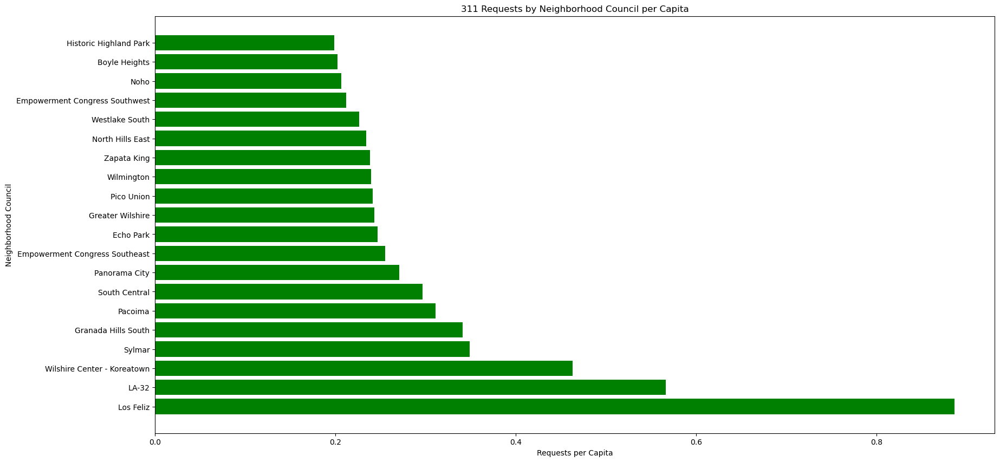

In [39]:
NC = list(grt_5_nc_ct['councilName'].head(20))
per_cap = list(grt_5_nc_ct['per_capita'].head(20))

plt.figure(figsize = (20, 10))
plt.barh(NC, per_cap, color = 'green')

plt.ylabel("Neighborhood Council")
plt.xlabel("Requests per Capita")
plt.title("311 Requests by Neighborhood Council per Capita")
plt.show()

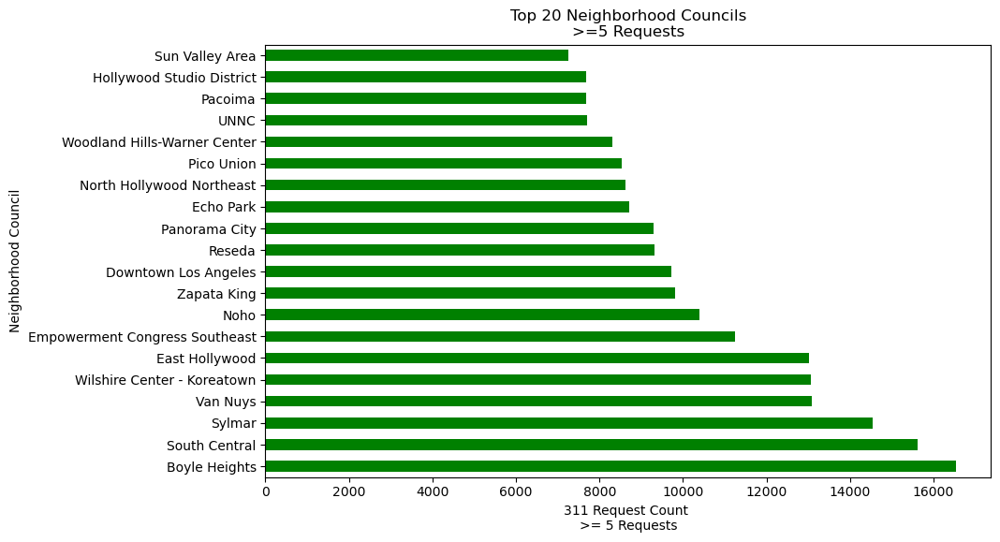

In [40]:
# Bar chart councilName for Neighborhood Councils with >=5 requests
plt.figure(figsize = (10,6))
grt_eq_5_df['councilName'].value_counts().sort_values(ascending = False).head(20).plot(kind = 'barh', color = 'green')
plt.title('Top 20 Neighborhood Councils\n>=5 Requests')
plt.ylabel('Neighborhood Council')
plt.xlabel('311 Request Count \n>= 5 Requests')

plt.savefig('../images/grt_eq_5_nc.jpg')

plt.show();

In [41]:
# count of requests by type and neighborhood council for addresses with >= 5 requests
grt_eq_5_type_nc_ct = grt_eq_5_df.groupby(['typeName', 'councilName'])['requestId'].agg('count').reset_index(name = 'request_count')
grt_eq_5_type_nc_ct.sort_values(by = 'request_count', ascending = False).head(20)

,typeName,councilName,request_count
418,Graffiti,South Central,11798
348,Graffiti,Boyle Heights,10807
423,Graffiti,Sylmar,7048
183,Bulky Items,Van Nuys,7028
357,Graffiti,Downtown Los Angeles,6750
359,Graffiti,East Hollywood,6707
443,Graffiti,Zapata King,5930
196,Bulky Items,Wilshire Center - Koreatown,5865
412,Graffiti,Pico Union,5499
166,Bulky Items,Panorama City,4961


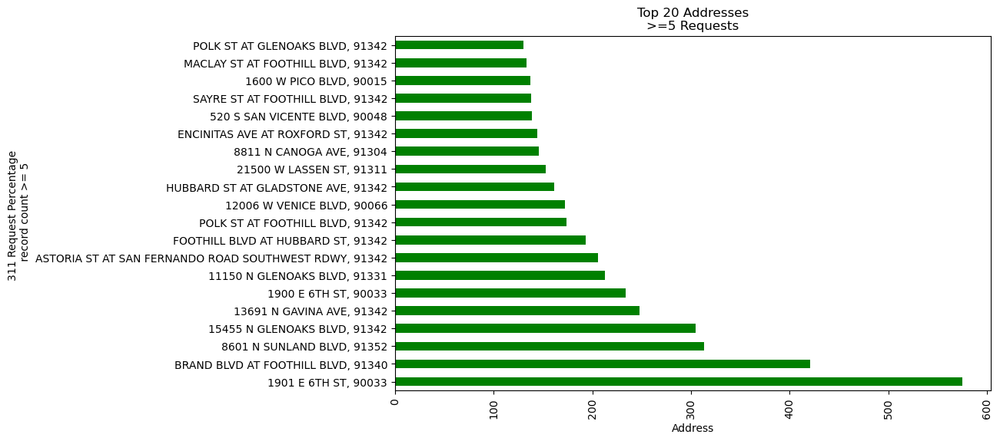

In [42]:
# Addresses with >=5 requests; top 20
plt.figure(figsize = (10,6))
grt_eq_5_df['address'].value_counts().sort_values(ascending = False).head(20).plot(kind = 'barh', color = 'green')
plt.title('Top 20 Addresses\n>=5 Requests')
plt.xlabel('Address')
plt.ylabel('311 Request Percentage \n record count >= 5')
plt.xticks(rotation=90)

plt.savefig('../images/grt_eq_5_addresses.jpg')

plt.show();

In [43]:
# count of requests by type and address for addresses with >= 5 requests
grt_eq_5_type_add_ct = grt_eq_5_df.groupby(['typeName', 'address'])['requestId'].agg('count').reset_index(name = 'request_count')
grt_eq_5_type_add_ct.sort_values(by = 'request_count', ascending = False).head(20)

,typeName,address,request_count
62758,Graffiti,"1901 E 6TH ST, 90033",575
76177,Graffiti,"BRAND BLVD AT FOOTHILL BLVD, 91340",421
83390,Homeless Encampment,"8601 N SUNLAND BLVD, 91352",263
62720,Graffiti,"1900 E 6TH ST, 90033",234
76071,Graffiti,ASTORIA ST AT SAN FERNANDO ROAD SOUTHWEST RDWY...,205
76460,Graffiti,"FOOTHILL BLVD AT HUBBARD ST, 91342",188
15072,Bulky Items,"15455 N GLENOAKS BLVD, 91342",184
77033,Graffiti,"POLK ST AT FOOTHILL BLVD, 91342",171
76621,Graffiti,"HUBBARD ST AT GLADSTONE AVE, 91342",161
6222,Bulky Items,"11150 N GLENOAKS BLVD, 91331",160


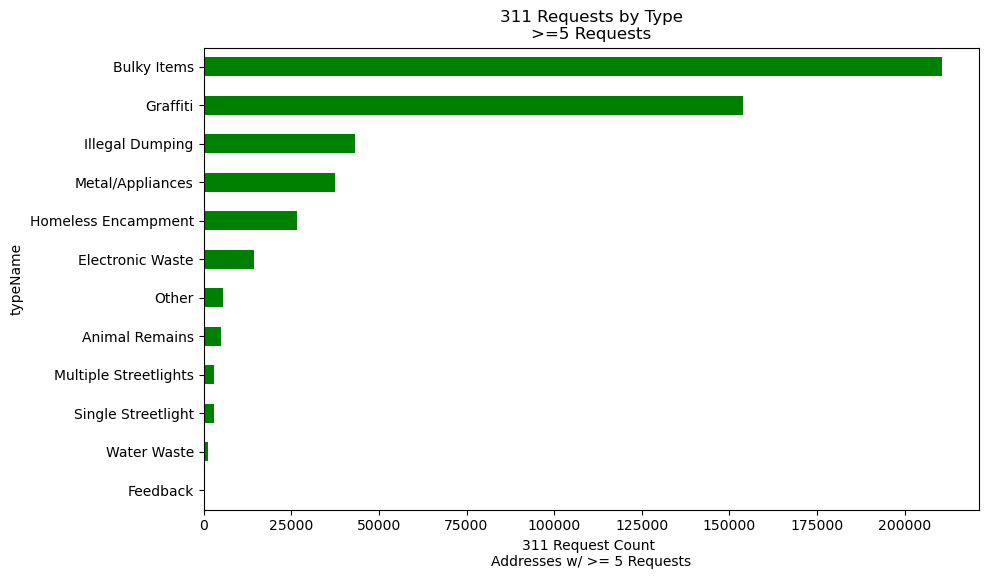

In [44]:
# Bar chart types of requests for address with >=5 requests
plt.figure(figsize = (10,6))
grt_eq_5_df['typeName'].value_counts().sort_values(ascending = True).plot(kind = 'barh', color = 'green')
plt.title('311 Requests by Type\n>=5 Requests')
plt.ylabel('typeName')
plt.xlabel('311 Request Count \nAddresses w/ >= 5 Requests')

plt.savefig('../images/grt_eq_5_type.jpg')

plt.show();

In [45]:
for value in sorted(grt_eq_5_df['typeName'].unique()):
    print(f'{value}: {(len(grt_eq_5_df[grt_eq_5_df["typeName"] == value]) / len(grt_eq_5_df))*100}% of >=5 dataset')
    print()

Animal Remains: 0.9631370181087239% of >=5 dataset

Bulky Items: 41.80976007976817% of >=5 dataset

Electronic Waste: 2.8711374709757895% of >=5 dataset

Feedback: 0.03317052629906308% of >=5 dataset

Graffiti: 30.550451973249064% of >=5 dataset

Homeless Encampment: 5.294770775773201% of >=5 dataset

Illegal Dumping: 8.578454253474463% of >=5 dataset

Metal/Appliances: 7.434964912733707% of >=5 dataset

Multiple Streetlights: 0.5698577242635448% of >=5 dataset

Other: 1.0757579068007526% of >=5 dataset

Single Streetlight: 0.5658852061438965% of >=5 dataset

Water Waste: 0.2526521524096302% of >=5 dataset



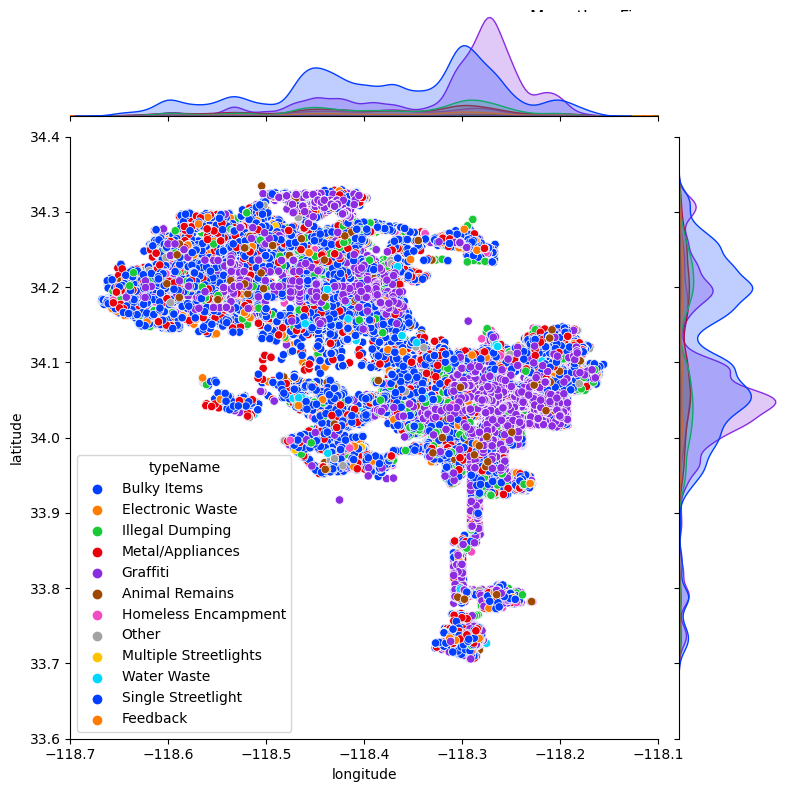

In [46]:
# Address with more than 5 requests
sns.jointplot(x = grt_eq_5_df['longitude'], y = grt_eq_5_df['latitude'], hue = grt_eq_5_df['typeName'],
              kind='scatter', height = 8, palette = 'bright', 
              xlim = (-118.7, -118.1), ylim = (33.6, 34.4)
             )
plt.title('More than Five \n 311 Request Count by Lat/Long', pad = 70, loc = 'right')

plt.savefig('../images/grt_eq_5_jointplt.jpg')

plt.show();

# Timeseries EDA
---

In [47]:
# Set Date to be in the index
df_311['createdDate'] = pd.to_datetime(df_311['createdDate'])
df_311['createdDay'] = df_311['createdDate'].dt.date
df_311.set_index('createdDay', inplace = True)

# Sort the index# Sort the index
df_311.sort_index(inplace = True)

df_311.head()

,requestId,createdDate,closedDate,typeId,typeName,address,latitude,longitude,agencyId,agencyName,sourceId,srnumber,sourceName,councilId,councilName,councilID,total_population,area,pop_density
createdDay,,,,,,,,,,,,,,,,,,,
2021-10-01,8610592,2021-10-01 00:01:14,2021-10-08 09:24:53,4,Bulky Items,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079512481,Phone Call,64,Pacoima,64,24732.0,17.038756,1451.514436
2021-10-01,8610569,2021-10-01 00:02:19,2021-10-08 13:36:33,5,Electronic Waste,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079516251,Phone Call,64,Pacoima,64,24732.0,17.038756,1451.514436
2021-10-01,8610575,2021-10-01 00:03:11,2021-10-13 12:31:58,4,Bulky Items,"4539 N VISTA DEL MONTE AVE, 91403",34.154158,-118.450025,3,Sanitation Bureau,8,1-2079512561,Phone Call,72,Sherman Oaks,72,NaN,NaN,NaN
2021-10-01,8612855,2021-10-01 00:04:14,2021-10-05 14:25:02,6,Illegal Dumping,"918 W COLLEGE ST, 90012",34.066466,-118.245113,3,Sanitation Bureau,3,1-2079516331,Email,38,Historic Cultural North,38,30626.0,2.840725,10781.050656
2021-10-01,8610587,2021-10-01 00:05:25,2021-10-08 14:16:32,7,Metal/Appliances,"11614 N HERRICK AVE, 91340",34.281312,-118.425453,3,Sanitation Bureau,8,1-2079516401,Phone Call,64,Pacoima,64,24732.0,17.038756,1451.514436


In [48]:
df_nc_ct = df_311.groupby(['createdDay', 'councilName', 'councilId', 'total_population'])['requestId'].agg('count').reset_index(name = 'request_ct')
df_nc_ct['nc_running_ct'] = df_nc_ct.groupby('councilName')['request_ct'].cumsum()
df_nc_ct['per_capita'] = df_nc_ct['nc_running_ct']/df_nc_ct['total_population']
df_nc_ct.set_index('createdDay', inplace = True)
df_nc_ct.head()

,councilName,councilId,total_population,request_ct,nc_running_ct,per_capita
createdDay,,,,,,
2021-10-01,Bel Air-Beverly Crest,4,26351.0,17,17,0.000645
2021-10-01,Boyle Heights,5,81681.0,240,240,0.002938
2021-10-01,CANNDU,6,35585.0,46,46,0.001293
2021-10-01,Canoga Park,7,71182.0,24,24,0.000337
2021-10-01,Central Alameda,8,46956.0,17,17,0.000362


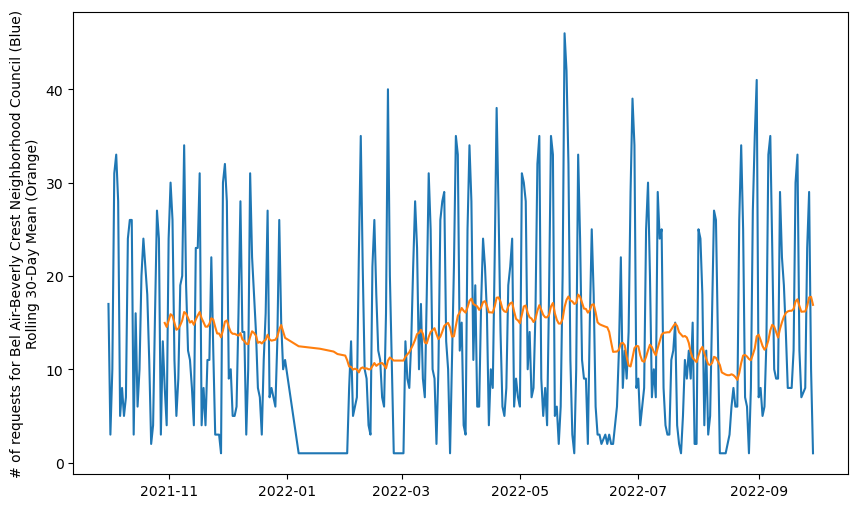

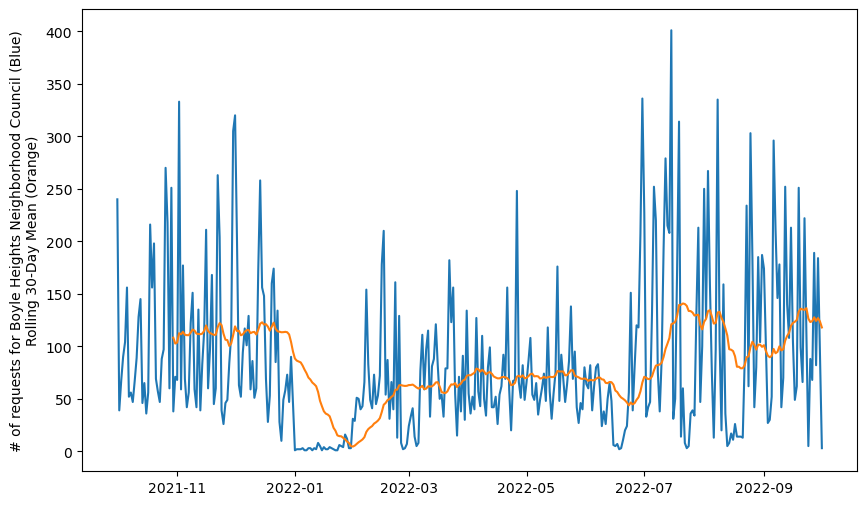

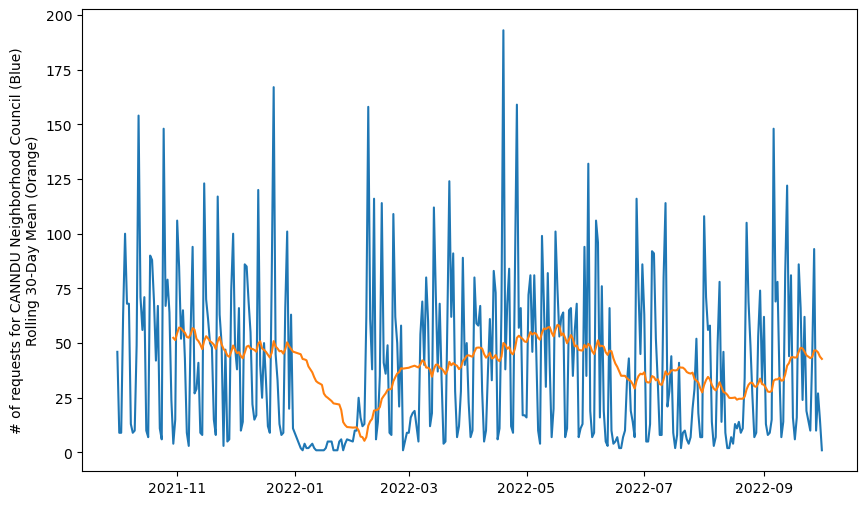

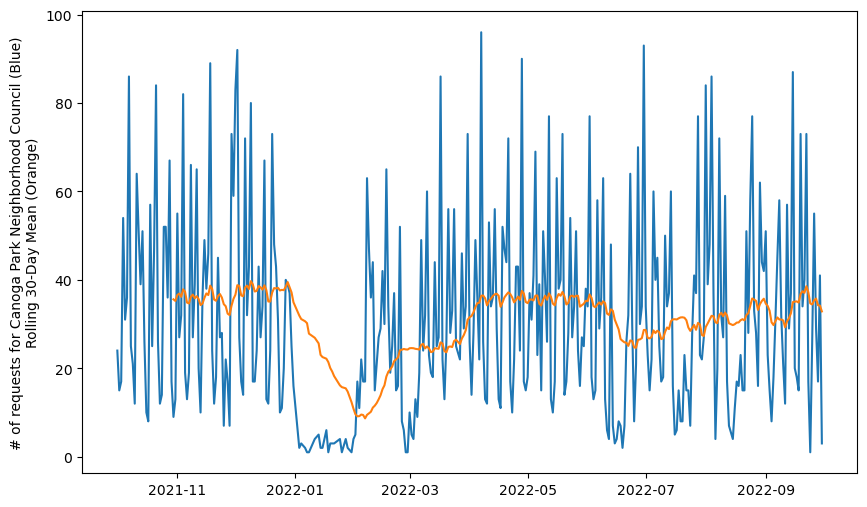

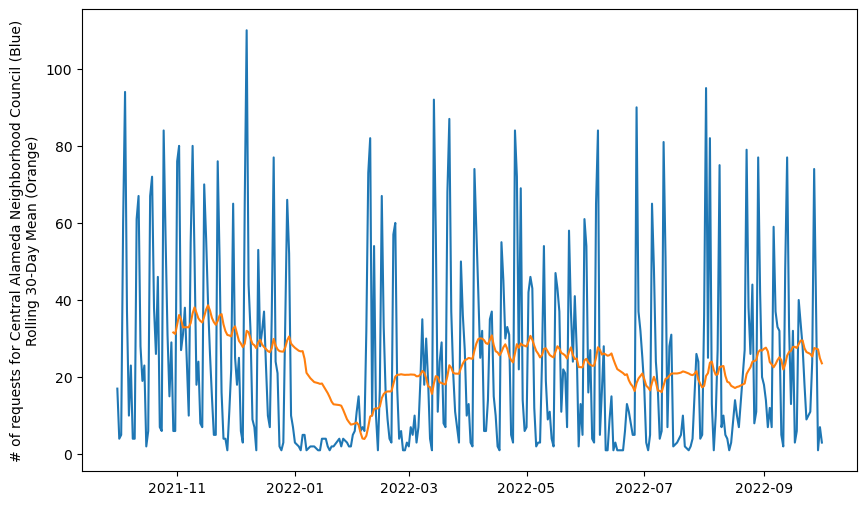

...

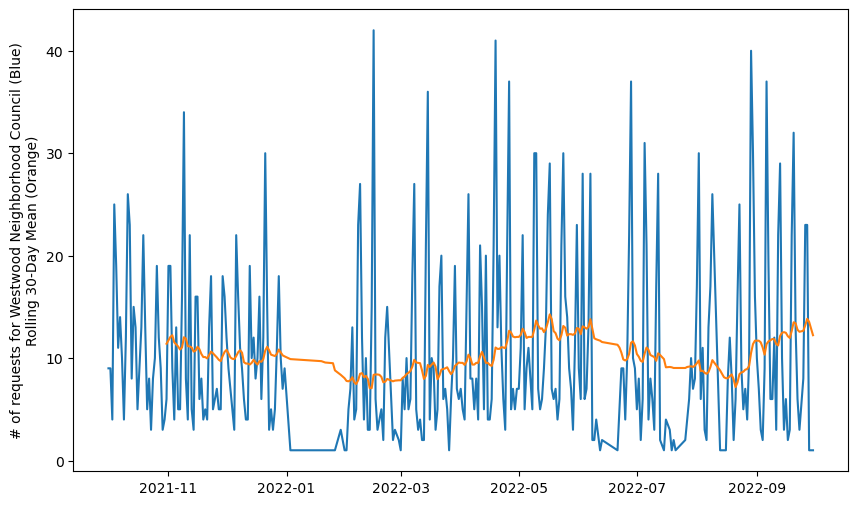

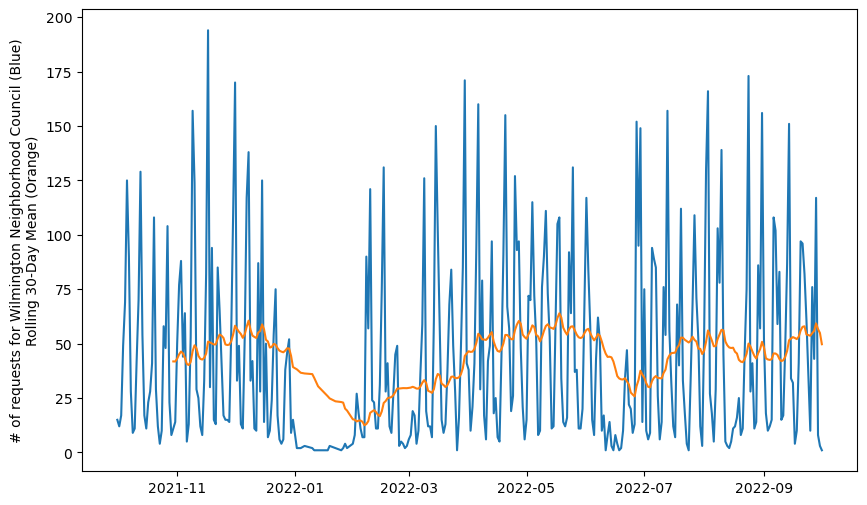

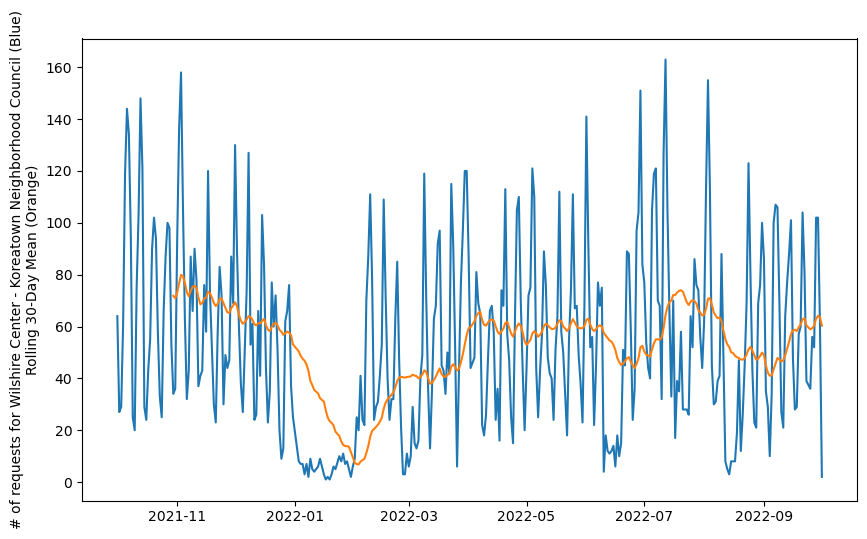

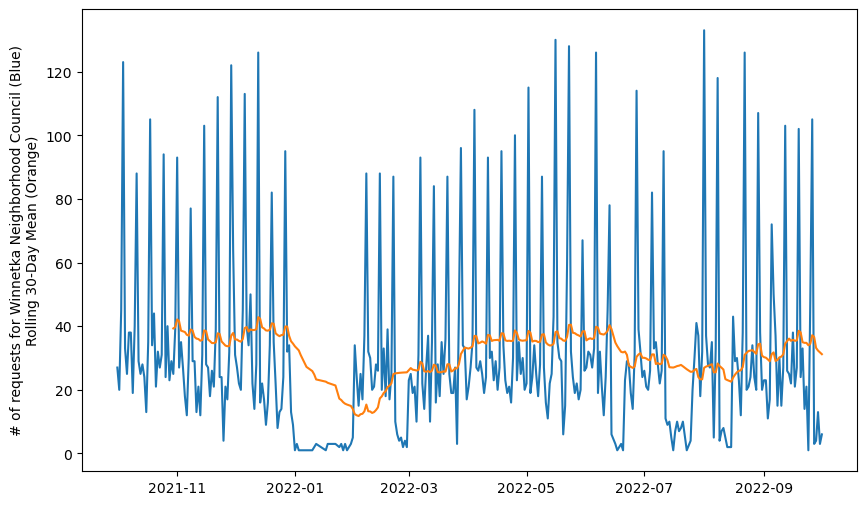

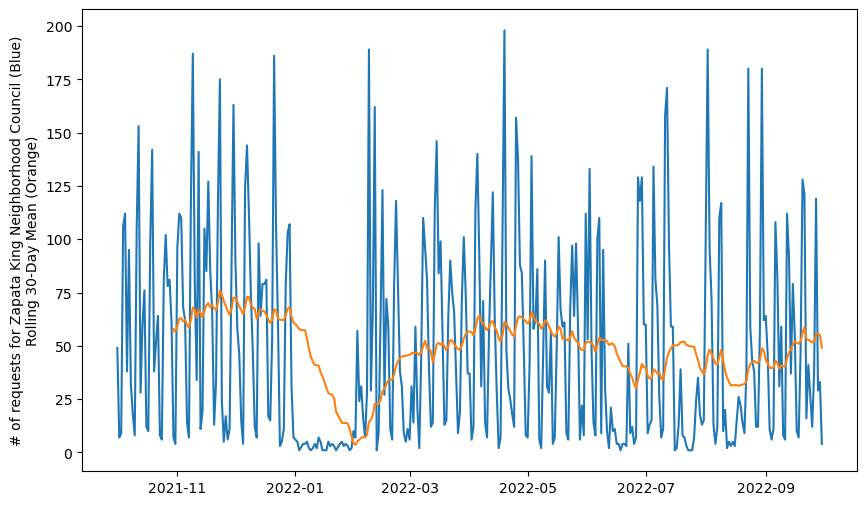

In [49]:
# by NC
for nc in df_nc_ct['councilName'].unique():
    plt.figure(figsize = (10,6))
    ts_plt = df_nc_ct[df_nc_ct['councilName'] == nc]
    plt.plot(ts_plt['request_ct'])
    plt.plot(ts_plt['request_ct'].rolling(30).mean())
    plt.ylabel(f'# of requests for {nc} Neighborhood Council (Blue)\nRolling 30-Day Mean (Orange)')
    plt.plot();